In [62]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import re
from pathlib import Path
from transformers import AutoTokenizer, AutoModel, CLIPModel, CLIPProcessor
from datasets import load_from_disk

# Gerät definieren (GPU falls verfügbar)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [63]:
# BERT-Modell und Tokenizer für Text-Embeddings
model_name_text = "bert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_name_text)
text_model = AutoModel.from_pretrained(model_name_text)
text_model.to(device)  # Modell auf das Gerät verschieben

# CLIP-Modell und -Prozessor für Bild-Embeddings
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
clip_model.to(device)  # CLIP-Modell ebenfalls auf das Gerät verschieben


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPSdpaAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e

In [64]:
def get_text_embedding(text):
    """
    Erzeugt ein Text-Embedding für einen gegebenen Text mittels BERT.
    Wir nutzen Mean-Pooling über die letzten Hidden States.
    """
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True)
    inputs = {k: v.to(device) for k, v in inputs.items()}
    with torch.no_grad():
        outputs = text_model(**inputs)
    embeddings = outputs.last_hidden_state.squeeze(0).cpu()
    mean_embedding = embeddings.mean(dim=0).numpy()
    return mean_embedding

def get_image_embedding(image):
    """
    Erzeugt ein Bild-Embedding mithilfe des CLIP-Modells.
    """
    inputs = clip_processor(images=image, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}
    with torch.no_grad():
        image_emb = clip_model.get_image_features(**inputs)
    image_emb = image_emb.squeeze().cpu().numpy()
    return image_emb


In [65]:
def get_combined_embedding(sample):
    """
    Erzeugt einen kombinierten Feature-Vektor aus der Frage (Text) und dem Bild.
    Die beiden Embeddings werden mittels Konkatenation zusammengeführt.
    """
    text_emb = get_text_embedding(sample["question"])
    image_emb = get_image_embedding(sample["image"])
    combined_embedding = np.concatenate([text_emb, image_emb])
    return combined_embedding


In [66]:
def sequential_selfdis_selection(dataset, M):
    """
    Wählt M Beispiele aus dem Datensatz aus, indem iterativ das Beispiel ausgewählt wird,
    das am dissimilarsten zu den bereits ausgewählten Beispielen ist (basierend auf der Cosinus-Similarität).
    """
    print("Extrahiere Embeddings für alle Beispiele...")
    embeddings = []
    for i, sample in enumerate(dataset):
        emb = get_combined_embedding(sample)
        embeddings.append(emb)
        if i % 100 == 0:
            print(f"{i} Beispiele verarbeitet...")
    embeddings = np.array(embeddings)

    selected_indices = [np.random.choice(len(dataset))]
    while len(selected_indices) < M:
        best_score = -np.inf
        best_idx = None
        for i in range(len(dataset)):
            if i in selected_indices:
                continue
            sim_sum = 0.0
            for j in selected_indices:
                dot_product = np.dot(embeddings[i], embeddings[j])
                norm_product = np.linalg.norm(embeddings[i]) * np.linalg.norm(embeddings[j])
                cos_sim = dot_product / norm_product if norm_product != 0 else 0
                sim_sum += cos_sim
            score = -sim_sum
            if score > best_score:
                best_score = score
                best_idx = i
        selected_indices.append(best_idx)
        print(f"Beispiel {best_idx} wurde hinzugefügt. (Auswahlgröße: {len(selected_indices)}/{M})")

    return selected_indices


In [67]:
def get_question_type(question):
    """
    Bestimmt den Fragetyp anhand des ersten Wortes der Frage.
    """
    q = question.strip().lower()
    match = re.match(r"(\w+)", q)
    if match:
        first_word = match.group(1)
        interrogatives = {"what", "where", "when", "how", "why", "who", "whom", "which"}
        if first_word in interrogatives:
            return first_word.capitalize()
        auxiliaries = {"is", "are", "do", "does", "did", "can", "could", "would", "will", "have", "has", "had", "am"}
        if first_word in auxiliaries:
            return "Yes/No"
        return "Other"
    else:
        return "Unknown"

def representative_selection_by_question_type(dataset, M_per_class=1):
    """
    Wählt für jeden Fragetyp repräsentative Beispiele aus.
    """
    groups = {}
    for idx, sample in enumerate(dataset):
        qtype = get_question_type(sample["question"])
        groups.setdefault(qtype, []).append(idx)

    selected_indices = []
    for qtype, indices in groups.items():
        group_embeddings = [get_combined_embedding(dataset[i]) for i in indices]
        group_embeddings = np.array(group_embeddings)
        centroid = group_embeddings.mean(axis=0)
        distances = np.linalg.norm(group_embeddings - centroid, axis=1)
        sorted_local_indices = np.argsort(distances)
        for local_idx in sorted_local_indices[:M_per_class]:
            selected_indices.append(indices[local_idx])
        print(f"Für Fragetyp '{qtype}' wurden {min(M_per_class, len(indices))} Beispiele ausgewählt (von insgesamt {len(indices)}).")

    return selected_indices


In [68]:
from sklearn.cluster import KMeans

def diverse_selection_kmeans(dataset, num_clusters):
    """
    Nutzt KMeans-Clustering zur Auswahl diverser Beispiele aus dem Datensatz.
    """
    print("Berechne Embeddings...")
    embeddings = [get_combined_embedding(sample) for sample in dataset]
    embeddings = np.array(embeddings)

    print("Führe KMeans-Clustering durch...")
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans.fit(embeddings)
    centers = kmeans.cluster_centers_
    labels = kmeans.labels_

    # Pro Cluster das nächstgelegene Beispiel zum Clusterzentrum wählen
    selected_indices = []
    for cluster_id in range(num_clusters):
        indices_in_cluster = np.where(labels == cluster_id)[0]
        cluster_embs = embeddings[indices_in_cluster]
        center = centers[cluster_id]
        distances = np.linalg.norm(cluster_embs - center, axis=1)
        best_local_idx = np.argmin(distances)
        selected_idx = indices_in_cluster[best_local_idx]
        selected_indices.append(selected_idx)
        
        print(f"{len(selected_indices)} diverse Beispiele ausgewählt.")
    return selected_indices

In [73]:
def diverse_selection_matching_distribution(dataset, total_target=100, sim_threshold=0.98):
    """
    Wählt Beispiele basierend auf der realen Fragetypverteilung (Table 4) + diverse Auswahl mit KMeans.
    """
    # Frageverteilung aus Table 4
    distribution = {
        "Yes/No": 0.250,
        "What": 0.250,
        "Where": 0.125,
        "How": 0.125,
        "How much": 0.0,
        "How many": 0.125,
        "When": 0.125,
        "Whose": 0.0
    }

    # Gruppiere nach Fragetyp
    from collections import defaultdict
    groups = defaultdict(list)
    for idx, sample in enumerate(dataset):
        qtype = get_question_type(sample["question"])
        # Unterscheide zwischen "How", "How many", "How much"
        if qtype.lower().startswith("how"):
            if "many" in sample["question"].lower():
                qtype = "How many"
            elif "much" in sample["question"].lower():
                qtype = "How much"
            else:
                qtype = "How"
        groups[qtype].append((idx, sample))

    selected_indices = []
    for qtype, ratio in distribution.items():
        target_count = int(round(ratio * total_target))
        available = groups.get(qtype, [])
        print(f"\nFragetyp '{qtype}' – Ziel: {target_count} Beispiele – Verfügbar: {len(available)}")

        if target_count < 1 or len(available) < 1:
            print(f"⚠️ Fragetyp '{qtype}' übersprungen (Ziel oder Verfügbarkeit zu gering).")
            continue

        n_clusters = min(target_count, len(available))
        embeddings = [get_combined_embedding(sample) for _, sample in available]
        embeddings = np.array(embeddings)

        # KMeans
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        kmeans.fit(embeddings)
        centers = kmeans.cluster_centers_
        labels = kmeans.labels_

        group_selected = []
        for cluster_id in range(n_clusters):
            indices_in_cluster = np.where(labels == cluster_id)[0]
            cluster_embs = embeddings[indices_in_cluster]
            center = centers[cluster_id]
            distances = np.linalg.norm(cluster_embs - center, axis=1)
            best_local_idx = np.argmin(distances)
            selected_idx = available[indices_in_cluster[best_local_idx]][0]
            selected_emb = embeddings[indices_in_cluster[best_local_idx]]

            # Duplikatprüfung
            is_duplicate = False
            for prev_idx in selected_indices:
                prev_emb = get_combined_embedding(dataset[prev_idx])
                sim = np.dot(prev_emb, selected_emb) / (np.linalg.norm(prev_emb) * np.linalg.norm(selected_emb))
                if sim >= sim_threshold:
                    is_duplicate = True
                    break
            if not is_duplicate:
                group_selected.append(selected_idx)

        print(f"→ Ausgewählt: {len(group_selected)}")
        selected_indices.extend(group_selected)

    print(f"\n✅ Insgesamt {len(selected_indices)} Beispiele ausgewählt.")
    return selected_indices


C:\Users\Arbnor\Desktop\BA\BA\Bachelor_Arbeit_VQA\venv\Lib\site-packages\PIL\TiffImagePlugin.py:949: UserWarning: Truncated File Read
  warnings.warn(str(msg))



Fragetyp 'Yes/No' – Ziel: 8 Beispiele – Verfügbar: 9728
→ Ausgewählt: 8

Fragetyp 'What' – Ziel: 8 Beispiele – Verfügbar: 8040
→ Ausgewählt: 8

Fragetyp 'Where' – Ziel: 4 Beispiele – Verfügbar: 1315
→ Ausgewählt: 4

Fragetyp 'How' – Ziel: 4 Beispiele – Verfügbar: 361
→ Ausgewählt: 4

Fragetyp 'How much' – Ziel: 0 Beispiele – Verfügbar: 3
⚠️ Fragetyp 'How much' übersprungen (Ziel oder Verfügbarkeit zu gering).

Fragetyp 'How many' – Ziel: 4 Beispiele – Verfügbar: 63
→ Ausgewählt: 4

Fragetyp 'When' – Ziel: 4 Beispiele – Verfügbar: 30
→ Ausgewählt: 4

Fragetyp 'Whose' – Ziel: 0 Beispiele – Verfügbar: 0
⚠️ Fragetyp 'Whose' übersprungen (Ziel oder Verfügbarkeit zu gering).

✅ Insgesamt 32 Beispiele ausgewählt.


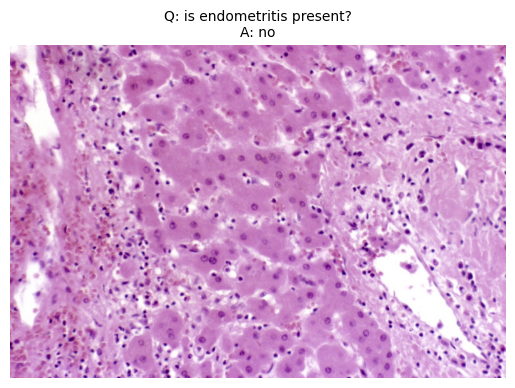

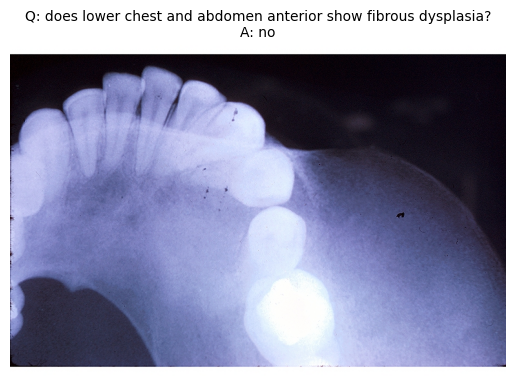

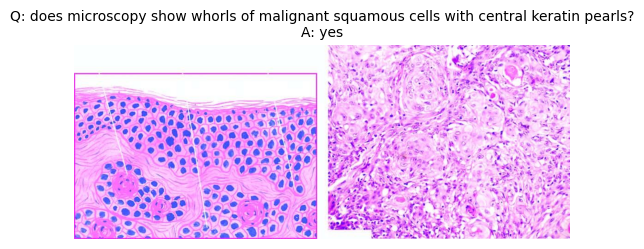

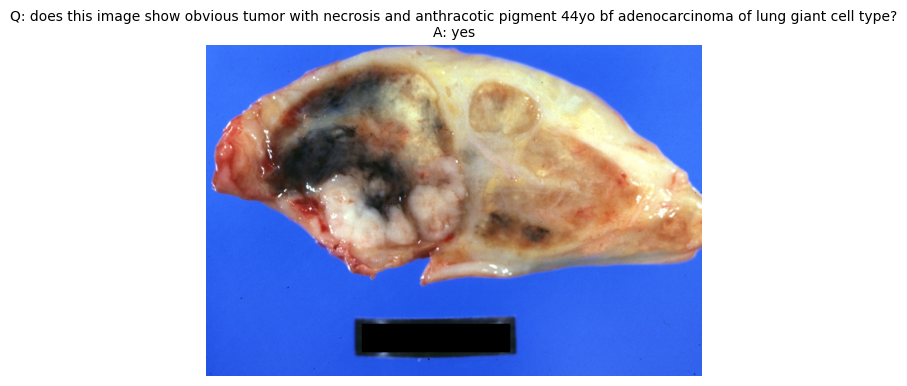

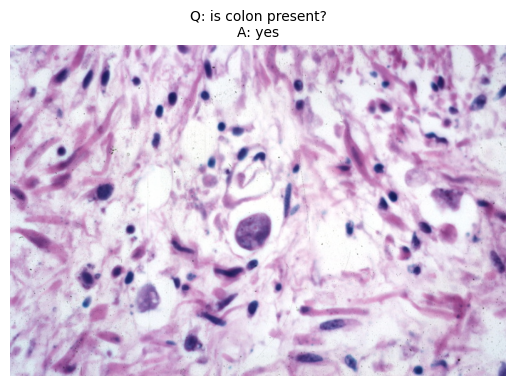

...

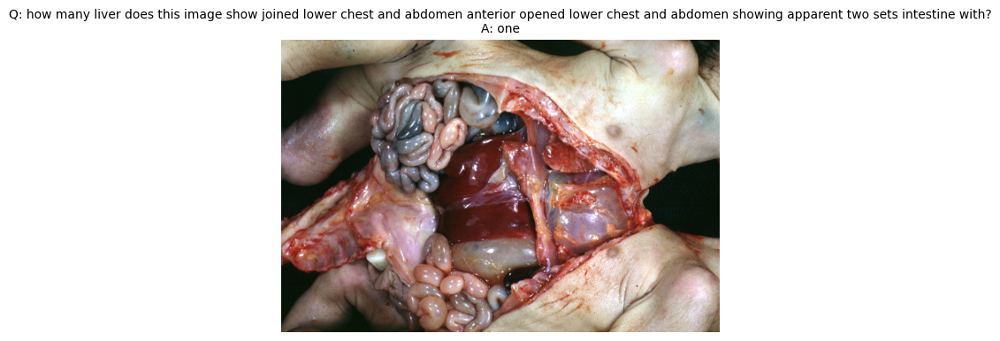

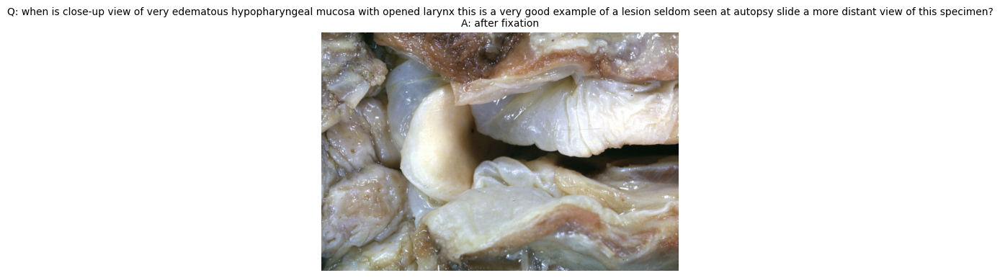

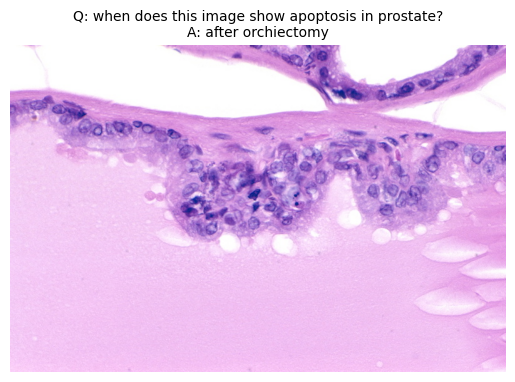

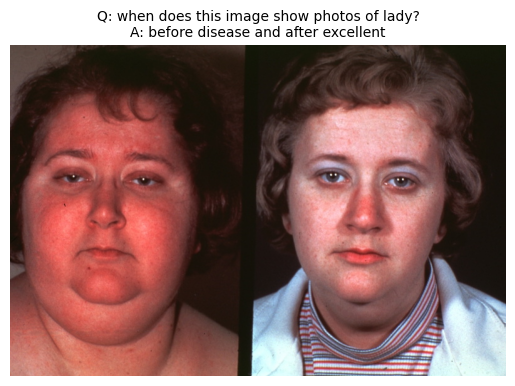

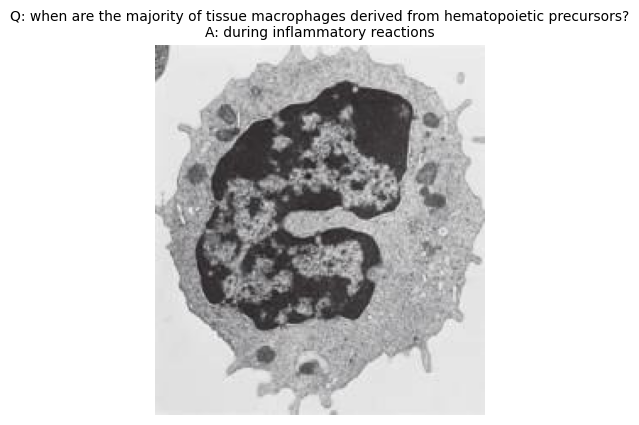

'\nselected_diverse_ids = diverse_selection_kmeans(dataset, num_clusters=10)\n\n# Beispiel: Repräsentative Auswahl pro Fragetyp\nM_per_class = 10  # Anzahl der Beispiele pro Fragetyp\nprint("Starte die repräsentative Auswahl pro Fragetyp...")\nselected_repr_indices = representative_selection_by_question_type(dataset, M_per_class)\n\n# Visualisierung\nfor idx in selected_diverse_ids:\n    sample = dataset[idx]\n    plt.figure()\n    plt.imshow(sample["image"])\n    plt.axis("off")\n    plt.title(f"Q: {sample[\'question\']}\nA: {sample[\'answer\']}", fontsize=10)\n    plt.show()\n\n# Beispiel (optional): Sequenzielle Auswahl\n\nM = 10  # Anzahl der gewünschten Beispiele\nprint("Starte die sequenzielle Auswahl (SelfDis)...")\nselected_indices = sequential_selfdis_selection(dataset, M)\n\nfor idx in selected_indices:\n    sample = dataset[idx]\n    plt.figure()\n    plt.imshow(sample["image"])\n    plt.axis("off")\n    plt.title(f"Q: {sample[\'question\']}\nA: {sample[\'answer\']}", fontsi

In [78]:
# Datensatzpfad
project_root = Path.cwd().parent
data_path_train = project_root / "data" / "train"
dataset = load_from_disk(str(data_path_train))

selected_indices = diverse_selection_matching_distribution(dataset, total_target=32)


for i in range(len(selected_indices)):
    idx_np = selected_indices[i] # Speichere den numpy.int64 Wert
    idx = int(idx_np) # Konvertiere zu einem normalen integer
    sample = dataset[idx]
    plt.figure()
    plt.imshow(sample["image"])
    plt.axis("off")
    plt.title(f"Q: {sample['question']}\nA: {sample['answer']}", fontsize=10)
    plt.show()


"""
selected_diverse_ids = diverse_selection_kmeans(dataset, num_clusters=10)

# Beispiel: Repräsentative Auswahl pro Fragetyp
M_per_class = 10  # Anzahl der Beispiele pro Fragetyp
print("Starte die repräsentative Auswahl pro Fragetyp...")
selected_repr_indices = representative_selection_by_question_type(dataset, M_per_class)

# Visualisierung
for idx in selected_diverse_ids:
    sample = dataset[idx]
    plt.figure()
    plt.imshow(sample["image"])
    plt.axis("off")
    plt.title(f"Q: {sample['question']}\nA: {sample['answer']}", fontsize=10)
    plt.show()

# Beispiel (optional): Sequenzielle Auswahl

M = 10  # Anzahl der gewünschten Beispiele
print("Starte die sequenzielle Auswahl (SelfDis)...")
selected_indices = sequential_selfdis_selection(dataset, M)

for idx in selected_indices:
    sample = dataset[idx]
    plt.figure()
    plt.imshow(sample["image"])
    plt.axis("off")
    plt.title(f"Q: {sample['question']}\nA: {sample['answer']}", fontsize=10)
    plt.show()
"""

In [79]:
selected_indices

[3873,
 7927,
 11699,
 3998,
 75,
 1224,
 974,
 10462,
 9172,
 4465,
 11279,
 7935,
 9764,
 6867,
 11616,
 17529,
 10652,
 15487,
 16198,
 6684,
 9236,
 13737,
 9194,
 3272,
 9122,
 17563,
 5324,
 12908,
 6749,
 4623,
 606,
 16988]

In [80]:
len(selected_indices)

32

In [81]:
# Zielpfad (roher Windows-Pfad als raw string, beachte das "r" vor dem String)
output_path = Path(r"C:\Users\Arbnor\Desktop\BA\BA\Bachelor_Arbeit_VQA\docs\selected_indices_few_shot_32_examples.txt")

# Sicherstellen, dass der Ordner existiert
output_path.parent.mkdir(parents=True, exist_ok=True)

# Liste speichern (ein Index pro Zeile)
with open(output_path, "w") as f:
    for idx in selected_indices:
        f.write(f"{idx}\n")

print(f"✅ Auswahl gespeichert unter: {output_path}")


✅ Auswahl gespeichert unter: C:\Users\Arbnor\Desktop\BA\BA\Bachelor_Arbeit_VQA\docs\selected_indices_few_shot_32_examples.txt
